In [3]:
import torchaudio
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import librosa

import os
import matplotlib.pyplot as plt
import torchaudio
import torchaudio.transforms as T


import scipy.ndimage as ndimage


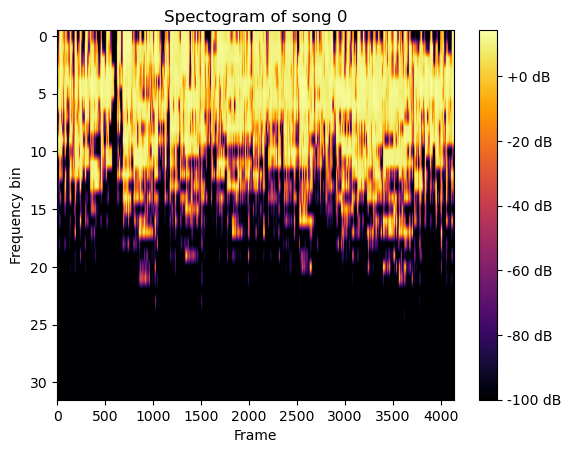

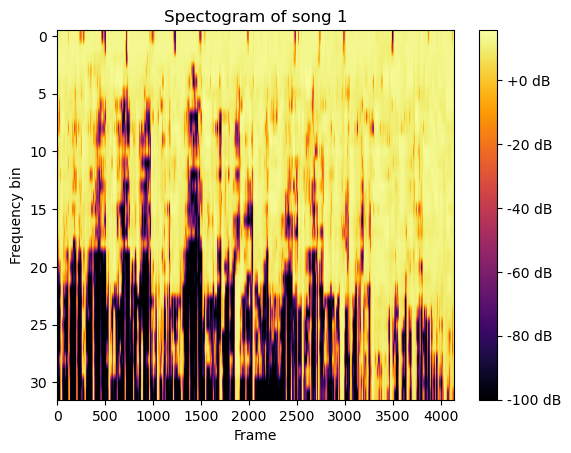

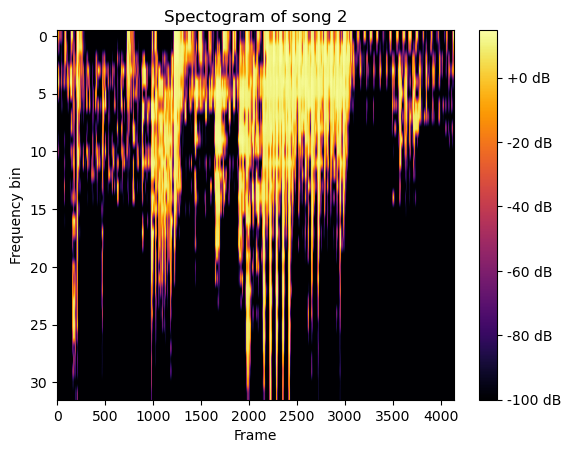

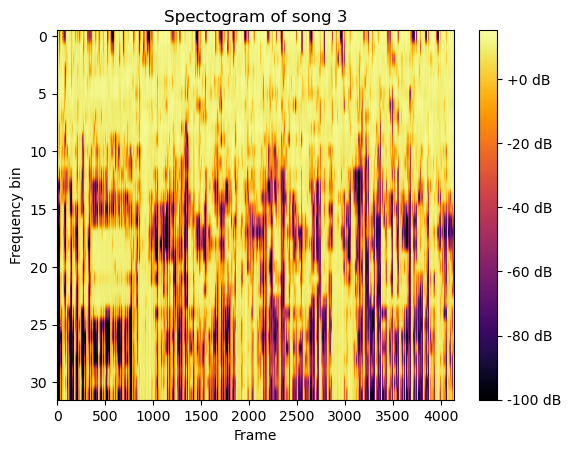

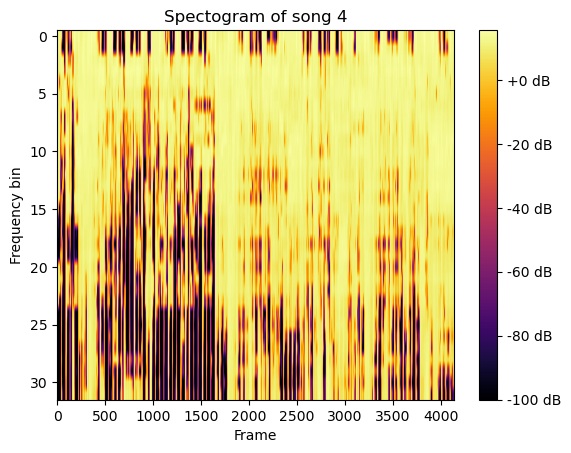

...

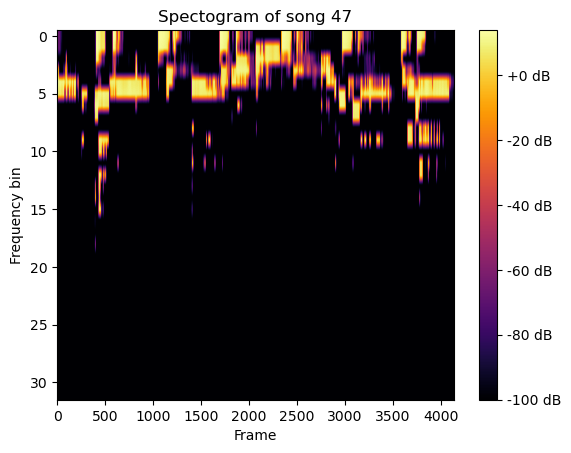

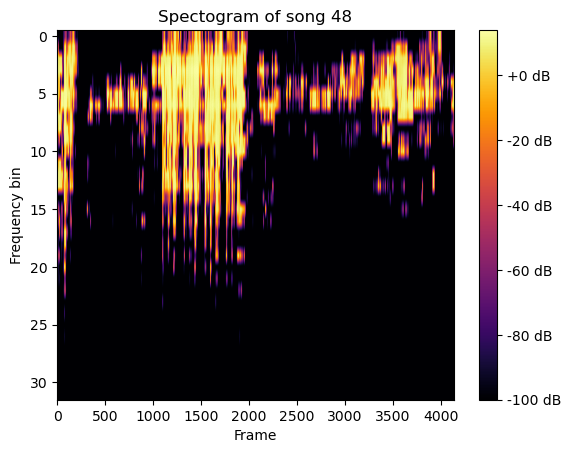

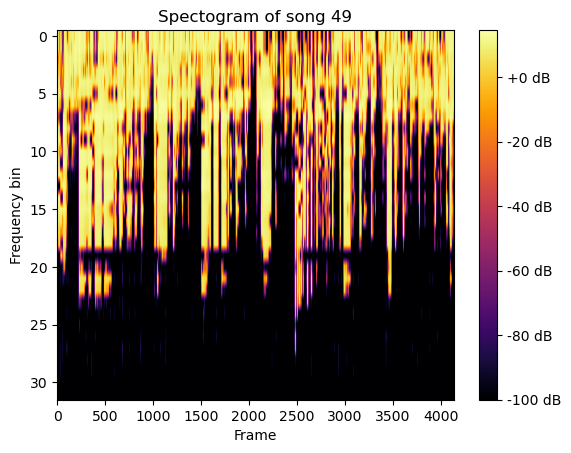

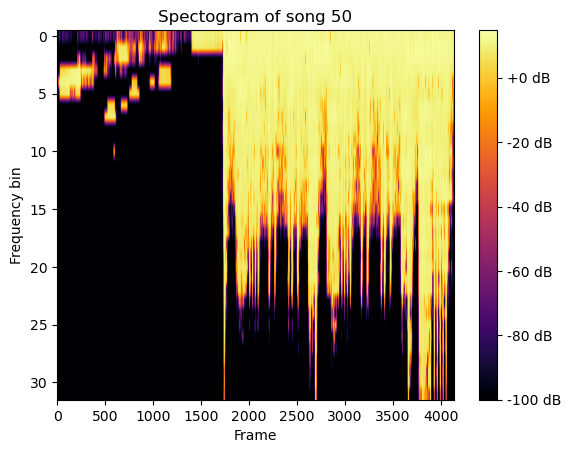

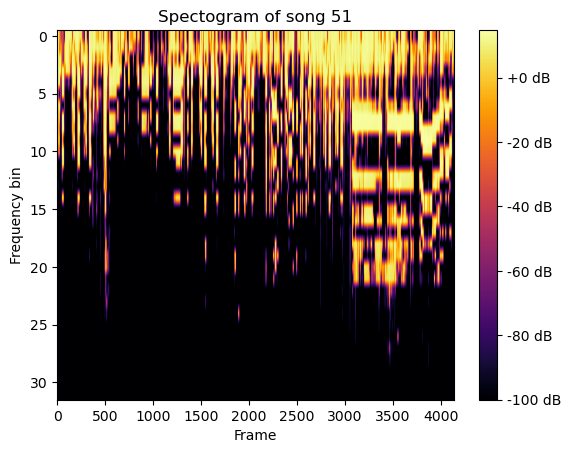

KeyboardInterrupt: 

In [8]:
# Directory containing .wav files
directory = "./data/train/song_"

def generate_mel_spectrograms(index, sample_rate=44100, n_fft=400, hop_length=160, n_mels=32):
    
    
    # Load the audio file
    file_path = directory+ str(index) + ".wav"
    waveform, sample_rate = torchaudio.load(file_path)

    # Define the MelSpectrogram transformation
    transform = T.MelSpectrogram(
        sample_rate=sample_rate,
        n_fft=n_fft,
        hop_length=hop_length,
        n_mels=n_mels
    )

    spectrogram = transform(waveform)
    spectrogram_db = torchaudio.transforms.AmplitudeToDB()(spectrogram)  # Convert to dB scale
    
    return spectrogram_db


def extract_fingerprints(spectrogram, threshold=0.5, min_distance=5):
    """
    Extracts peaks from a spectrogram and returns the corresponding time-frequency pairs as fingerprints.
    
    Args:
        spectrogram (numpy.ndarray): Spectrogram of the audio signal.
        threshold (float): Threshold value for peak detection (between 0 and 1).
        min_distance (int): Minimum distance (in pixels) between two peaks.
        
    Returns:
        list: A list of time-frequency pairs representing the fingerprints.
    """
    # Normalize the spectrogram
    spectrogram = spectrogram.detach().numpy().squeeze()
    spectrogram = spectrogram / np.max(spectrogram)
    
    # Find peaks using maximum filter
    neighborhood_size = (2 * min_distance) + 1
    footprint = np.ones((neighborhood_size, neighborhood_size))
    local_max = ndimage.maximum_filter(spectrogram, footprint=footprint) == spectrogram
    background = (spectrogram == 0)
    eroded_background = ndimage.binary_erosion(background, structure=footprint, border_value=1)
    detected_peaks = local_max ^ eroded_background
    
    # Apply threshold to the peaks
    thresholded_peaks = detected_peaks & (spectrogram > threshold)
    
    # Get indices of the thresholded peaks
    peaks_indices = np.argwhere(thresholded_peaks)
    
    # Extract time-frequency pairs as fingerprints
    fingerprints = [(frequency, time) for frequency, time in peaks_indices]
    
    return fingerprints



# Spectrogram parameters
n_fft = 400  # Number of FFT bins
hop_length = 160  # Hop length for STFT
win_length = 400  # Window length for STFT

# Define the spectrogram transformation
transform = T.Spectrogram(n_fft=n_fft, hop_length=hop_length, win_length=win_length)

# Loop through each .wav file
for i in range(300):
    # Load the audio file
    
    
# Loop through each .wav file
for file in test_csv['fname']:
    # Load the audio file using torchaudio
    file_path = os.path.join(data_dir, 'test', file + '.wav')
    waveform, sample_rate = torchaudio.load(file_path)

    # Compute the spectrogram
    spectrogram = generate_mel_spectrograms(waveform, sample_rate)    
    test_spectrograms.append(spectrogram.T)

train_spectrograms = pad_sequence(train_spectrograms, batch_first=True).transpose(1,2)
test_spectrograms = pad_sequence(test_spectrograms, batch_first=True).transpose(1,2)